# WEEK 1: Data Importing and Cleaning

## Task 1: Import the dataset and inspect its structure.

### 1. Import libraries 

In [1]:
# Data importation, visualization, processing, and EDA
import pandas as pd 
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt

# Advanced visualizations
from ydata_profiling import ProfileReport

# Modeling and machine learning
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import warnings
warnings.filterwarnings('ignore')

### 2. Data importation 

In [2]:
df= pd.read_csv("ObesityDataSet_raw_and_data_sinthetic.csv", delimiter=",")
df

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,Female,21.000000,1.620000,64.000000,yes,no,2.0,3.0,Sometimes,no,2.000000,no,0.000000,1.000000,no,Public_Transportation,Normal_Weight
1,Female,21.000000,1.520000,56.000000,yes,no,3.0,3.0,Sometimes,yes,3.000000,yes,3.000000,0.000000,Sometimes,Public_Transportation,Normal_Weight
2,Male,23.000000,1.800000,77.000000,yes,no,2.0,3.0,Sometimes,no,2.000000,no,2.000000,1.000000,Frequently,Public_Transportation,Normal_Weight
3,Male,27.000000,1.800000,87.000000,no,no,3.0,3.0,Sometimes,no,2.000000,no,2.000000,0.000000,Frequently,Walking,Overweight_Level_I
4,Male,22.000000,1.780000,89.800000,no,no,2.0,1.0,Sometimes,no,2.000000,no,0.000000,0.000000,Sometimes,Public_Transportation,Overweight_Level_II
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,Female,20.976842,1.710730,131.408528,yes,yes,3.0,3.0,Sometimes,no,1.728139,no,1.676269,0.906247,Sometimes,Public_Transportation,Obesity_Type_III
2107,Female,21.982942,1.748584,133.742943,yes,yes,3.0,3.0,Sometimes,no,2.005130,no,1.341390,0.599270,Sometimes,Public_Transportation,Obesity_Type_III
2108,Female,22.524036,1.752206,133.689352,yes,yes,3.0,3.0,Sometimes,no,2.054193,no,1.414209,0.646288,Sometimes,Public_Transportation,Obesity_Type_III
2109,Female,24.361936,1.739450,133.346641,yes,yes,3.0,3.0,Sometimes,no,2.852339,no,1.139107,0.586035,Sometimes,Public_Transportation,Obesity_Type_III


### 3. General information on the data

In [3]:
df.columns

Index(['Gender', 'Age', 'Height', 'Weight', 'family_history_with_overweight',
       'FAVC', 'FCVC', 'NCP', 'CAEC', 'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE',
       'CALC', 'MTRANS', 'NObeyesdad'],
      dtype='object')

### 3.1. Daccuracy_scoreata understanding:
1. Gender (categorical)
2. Age (Continuous): Age of the individual
3. Height (Continuous): Height in meters
4. Weight (Continuous): Weight in kilograms
5. family_history_with_overweight (Binary): Whether the individual has a family me ber
suffering from overweight
6. FAVC (Binary): Whether the individual eats high-calorie food frequently
7. FCVC (Continuous): Frequency of vegetable consumption in meals
8. NCP (Continuous): Number of main meals consumed daily
9. CAEC (Categorical): Food consumption between meals
10. SMOKE (Binary): Whether tual smokes or nothe individ
11. Target Feature:  NObeyesdad (Categorical): Obesity level categorized into ual smokes

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2111 entries, 0 to 2110
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Gender                          2111 non-null   object 
 1   Age                             2111 non-null   float64
 2   Height                          2111 non-null   float64
 3   Weight                          2111 non-null   float64
 4   family_history_with_overweight  2111 non-null   object 
 5   FAVC                            2111 non-null   object 
 6   FCVC                            2111 non-null   float64
 7   NCP                             2111 non-null   float64
 8   CAEC                            2111 non-null   object 
 9   SMOKE                           2111 non-null   object 
 10  CH2O                            2111 non-null   float64
 11  SCC                             2111 non-null   object 
 12  FAF                             21

In [5]:
df.shape

(2111, 17)

In [6]:
df.describe()

,Age,Height,Weight,FCVC,NCP,CH2O,FAF,TUE
count,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000
mean,24.312600,1.701677,86.586058,2.419043,2.685628,2.008011,1.010298,0.657866
std,6.345968,0.093305,26.191172,0.533927,0.778039,0.612953,0.850592,0.608927
min,14.000000,1.450000,39.000000,1.000000,1.000000,1.000000,0.000000,0.000000
25%,19.947192,1.630000,65.473343,2.000000,2.658738,1.584812,0.124505,0.000000
50%,22.777890,1.700499,83.000000,2.385502,3.000000,2.000000,1.000000,0.625350
75%,26.000000,1.768464,107.430682,3.000000,3.000000,2.477420,1.666678,1.000000
max,61.000000,1.980000,173.000000,3.000000,4.000000,3.000000,3.000000,2.000000


#### 3.2. Checking for missing values

In [7]:
df.isnull().sum()

Gender                            0
Age                               0
Height                            0
Weight                            0
family_history_with_overweight    0
FAVC                              0
FCVC                              0
NCP                               0
CAEC                              0
SMOKE                             0
CH2O                              0
SCC                               0
FAF                               0
TUE                               0
CALC                              0
MTRANS                            0
NObeyesdad                        0
dtype: int64

#### 3.3. Checking datatypes

In [8]:
df.dtypes

Gender                             object
Age                               float64
Height                            float64
Weight                            float64
family_history_with_overweight     object
FAVC                               object
FCVC                              float64
NCP                               float64
CAEC                               object
SMOKE                              object
CH2O                              float64
SCC                                object
FAF                               float64
TUE                               float64
CALC                               object
MTRANS                             object
NObeyesdad                         object
dtype: object

#### 3.4. Checking for duplicates

In [9]:
duplicates=df[df.duplicated(keep="first")]

In [10]:
duplicates.shape

(24, 17)

#### 3.5. Check if the variables are binary or multi-class: 

In [11]:
#categorizing the columns into four lists based on both their data type (categorical vs numerical) 
#and whether they are binary or multi-class
def binaryOrMulti(df):
    cat_multi = []
    cat_binary = []
    num_multi = []
    num_binary = []
    
    for col in df.columns:
        unique_values = df[col].nunique()
        if df[col].dtype == 'object':  # Categorical data (strings or objects)
            if unique_values == 2:
                cat_binary.append(col)
            else:
                cat_multi.append(col)
        else:  # Numerical data
            if unique_values == 2:
                num_binary.append(col)
            else:
                num_multi.append(col)
    
    return cat_binary, cat_multi, num_binary, num_multi


In [12]:
binaryOrMulti(df)

(['Gender', 'family_history_with_overweight', 'FAVC', 'SMOKE', 'SCC'],
 ['CAEC', 'CALC', 'MTRANS', 'NObeyesdad'],
 [],
 ['Age', 'Height', 'Weight', 'FCVC', 'NCP', 'CH2O', 'FAF', 'TUE'])

In [13]:
cat_binary=['Gender', 'family_history_with_overweight', 'FAVC', 'SMOKE', 'SCC']
cat_multi=['CAEC', 'CALC', 'MTRANS', 'NObeyesdad']
num_binary= []
num_multi=['Age', 'Height', 'Weight', 'FCVC', 'NCP', 'CH2O', 'FAF', 'TUE']

### CONCLUSION: 
- The data contains 2111 rows and 17 columns
- The data doesn't contain any missing values
- The data has 24 duplicated rows
- The data contains 8 numerical variables that are not binary and 9 categorical ones of which 5 are binary and 4 multi-class. 

## Task 2: Data Type Conversion and Encoding
- Label encode binary categorical variables.
- One-hot encode multi-class categorical variable.

### 1. Encoding Binary variables: 

In [14]:
encoder1 = LabelEncoder()

In [15]:
df[cat_binary]= df[cat_binary].apply(encoder1.fit_transform)

### 2. Encoding Multi-class variables: 

In [16]:
encoder = LabelEncoder()

# Apply encoding directly on the entire column
df['NObeyesdad'] = encoder.fit_transform(df['NObeyesdad'])

In [17]:
# Initialize OneHotEncoder
encoder2 = OneHotEncoder()

In [18]:
# One-hot encode multi-class variables
df = pd.get_dummies(df, columns=['CAEC', 'CALC', 'MTRANS'], drop_first=True, dtype=int)    

In [19]:
df

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,SMOKE,CH2O,...,CAEC_Frequently,CAEC_Sometimes,CAEC_no,CALC_Frequently,CALC_Sometimes,CALC_no,MTRANS_Bike,MTRANS_Motorbike,MTRANS_Public_Transportation,MTRANS_Walking
0,0,21.000000,1.620000,64.000000,1,0,2.0,3.0,0,2.000000,...,0,1,0,0,0,1,0,0,1,0
1,0,21.000000,1.520000,56.000000,1,0,3.0,3.0,1,3.000000,...,0,1,0,0,1,0,0,0,1,0
2,1,23.000000,1.800000,77.000000,1,0,2.0,3.0,0,2.000000,...,0,1,0,1,0,0,0,0,1,0
3,1,27.000000,1.800000,87.000000,0,0,3.0,3.0,0,2.000000,...,0,1,0,1,0,0,0,0,0,1
4,1,22.000000,1.780000,89.800000,0,0,2.0,1.0,0,2.000000,...,0,1,0,0,1,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,0,20.976842,1.710730,131.408528,1,1,3.0,3.0,0,1.728139,...,0,1,0,0,1,0,0,0,1,0
2107,0,21.982942,1.748584,133.742943,1,1,3.0,3.0,0,2.005130,...,0,1,0,0,1,0,0,0,1,0
2108,0,22.524036,1.752206,133.689352,1,1,3.0,3.0,0,2.054193,...,0,1,0,0,1,0,0,0,1,0
2109,0,24.361936,1.739450,133.346641,1,1,3.0,3.0,0,2.852339,...,0,1,0,0,1,0,0,0,1,0


## Task 3: Outlier Detection and Handling

### 1. outlier detection: 

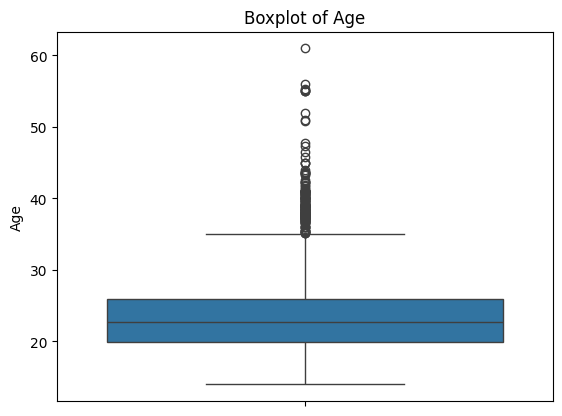

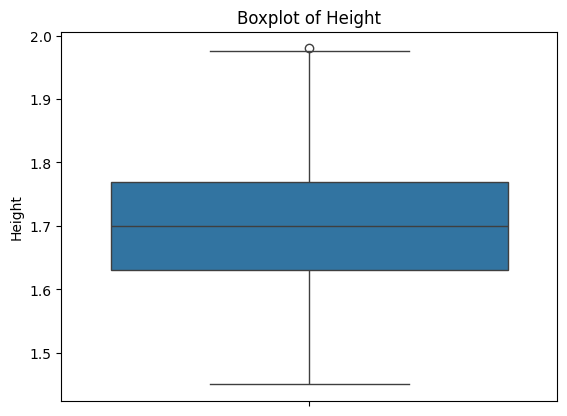

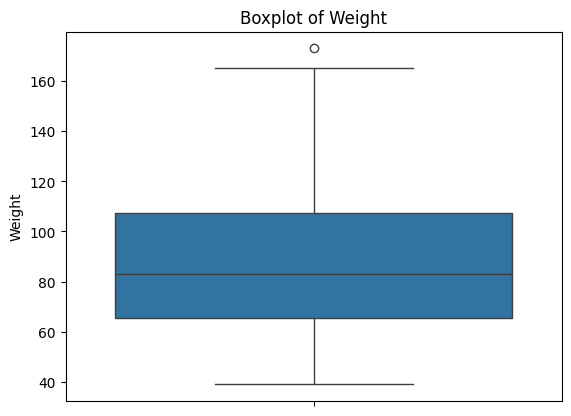

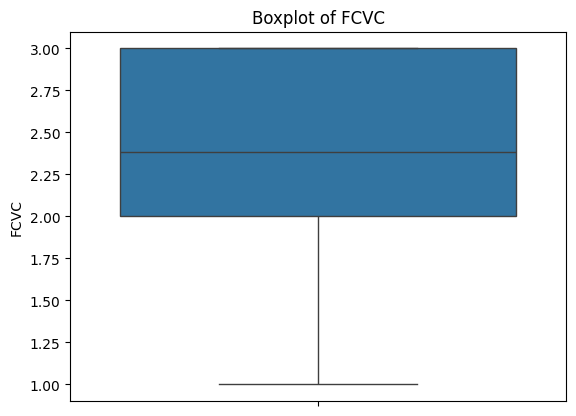

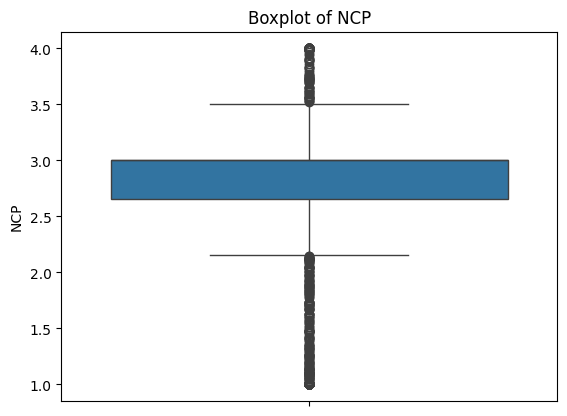

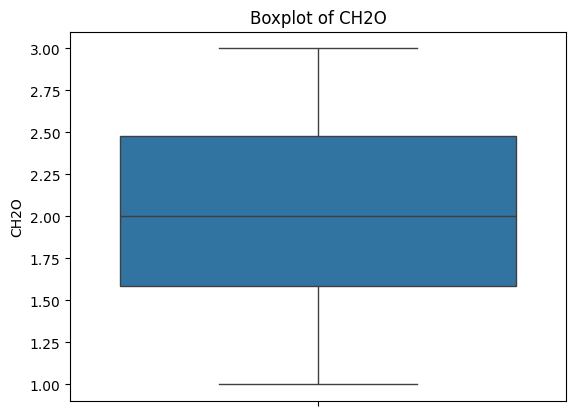

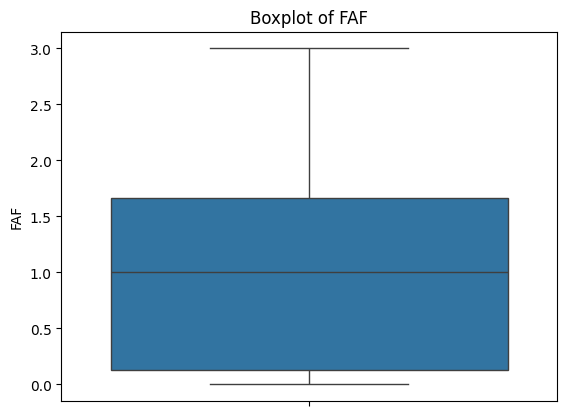

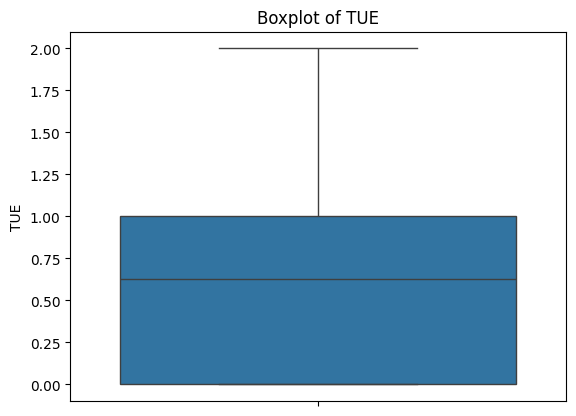

In [20]:
for col in num_multi:
    sns.boxplot(df[col])
    plt.title(f'Boxplot of {col}')
    plt.show()

Based on the boxplots of columns of data, the outliers are detected on four columns: weight, age, height and NCP.

### 2. Handling outliers using transformations: 

In [21]:
# Log transformation for skewed features
df['Age'] = np.log1p(df['Age'])
df['Weight'] = np.log1p(df['Weight'])
df['height'] = np.log1p(df['Height'])
df['NCP'] = np.log1p(df['NCP'])

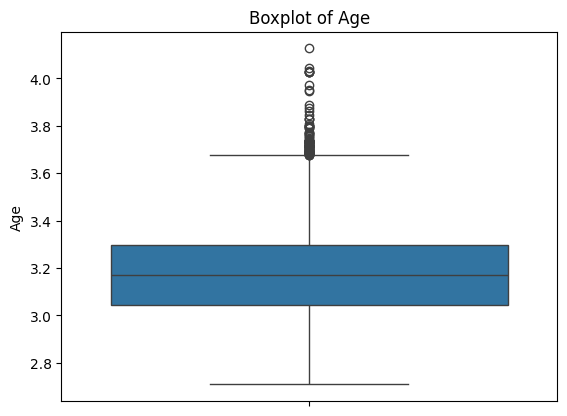

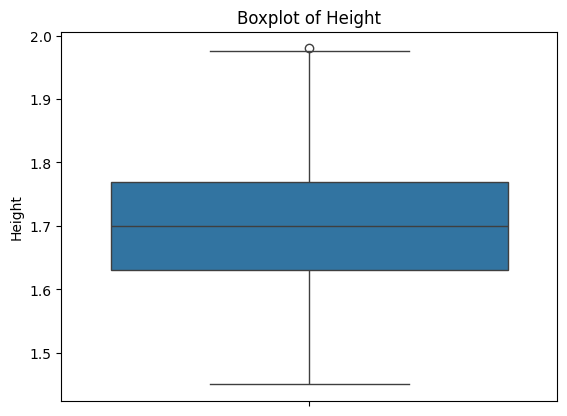

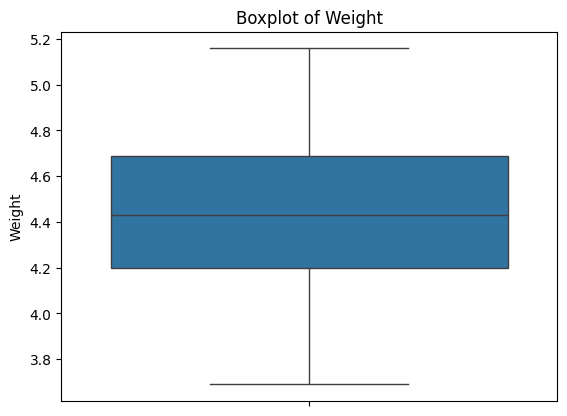

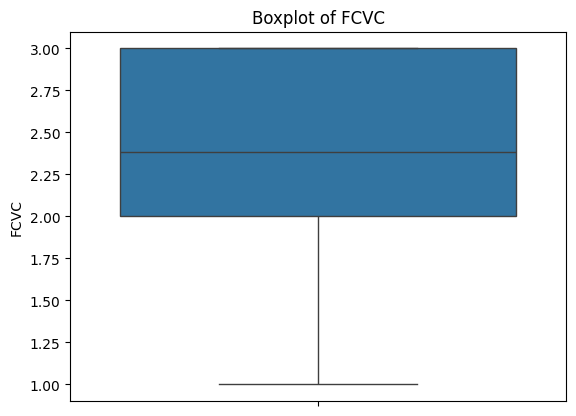

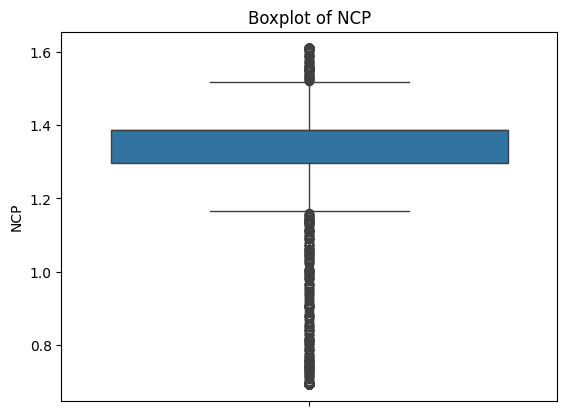

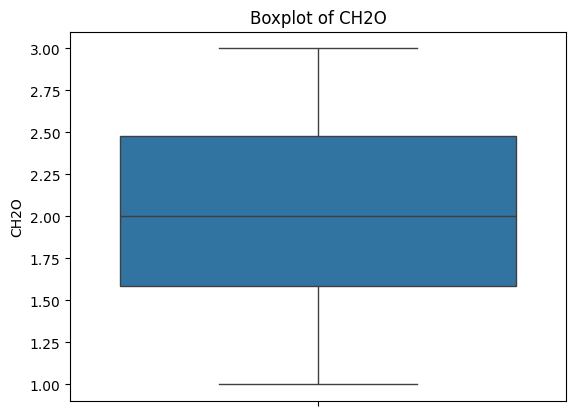

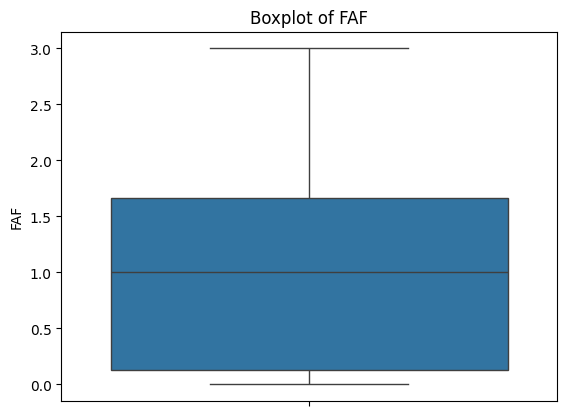

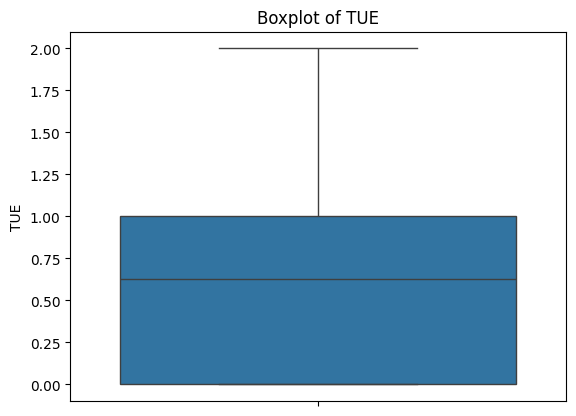

In [22]:
#visualization of outliers after transformations
for col in num_multi:
    sns.boxplot(df[col])
    plt.title(f'Boxplot of {col}')
    plt.show()

The outliers are present but lessened after transformations, therefore we use a different approach.

### 3. Handling outliers using capping: 

In [23]:
def cap_outliers(data, feature):
    Q1 = data[feature].quantile(0.25)
    Q3 = data[feature].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    data[feature] = np.where(data[feature] > upper_bound, upper_bound,
                             np.where(data[feature] < lower_bound, lower_bound, data[feature]))
    return data

data = cap_outliers(df, 'Age')
data = cap_outliers(df, 'Weight')
data = cap_outliers(df, 'NCP')
data = cap_outliers(df, 'Height')

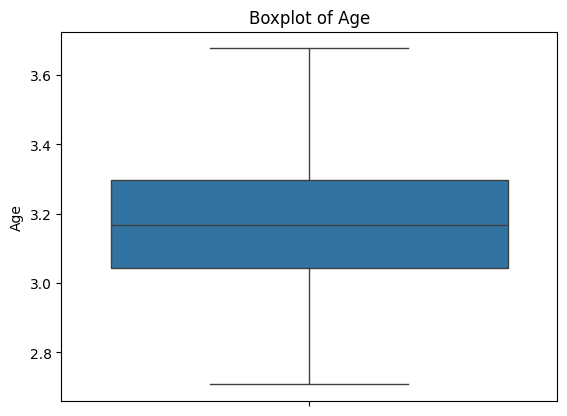

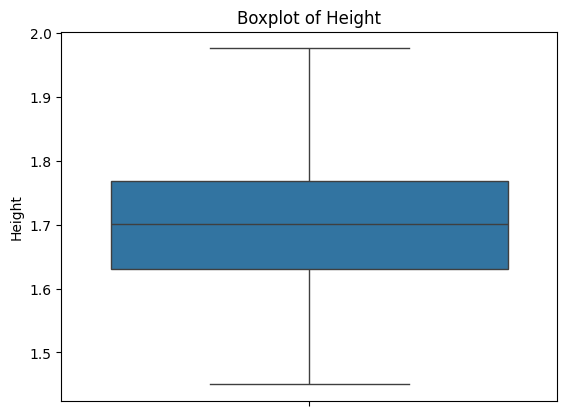

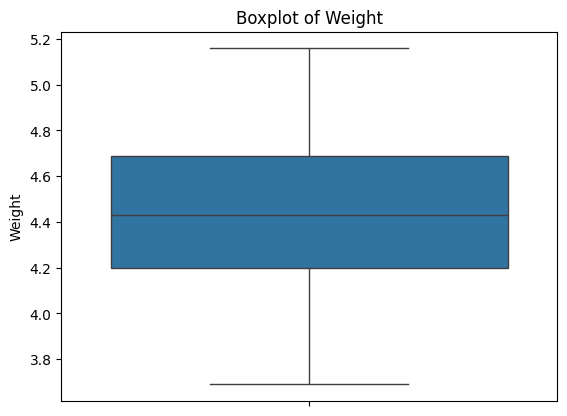

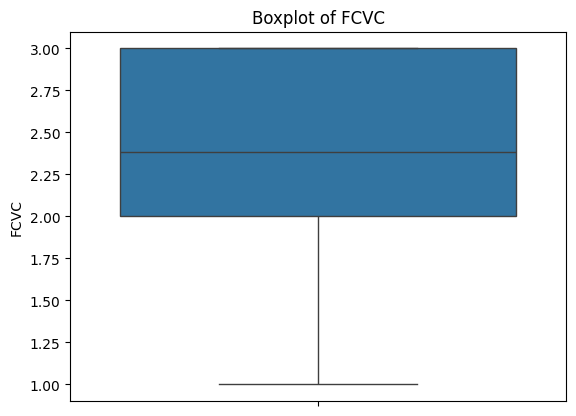

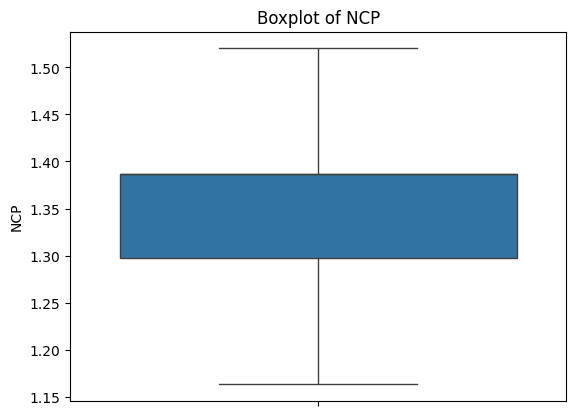

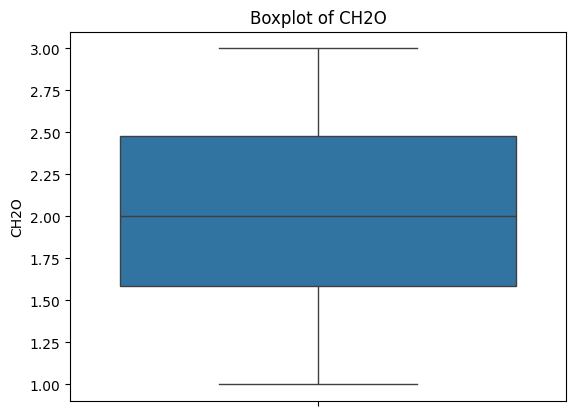

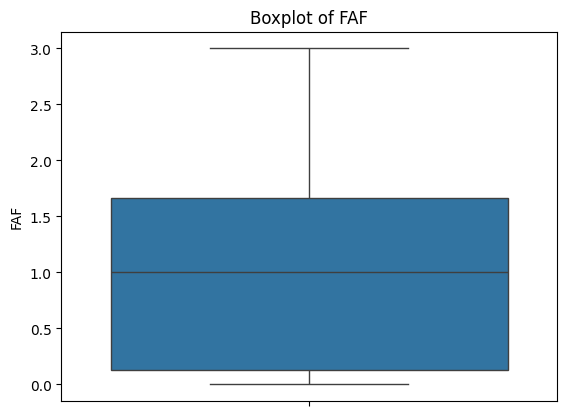

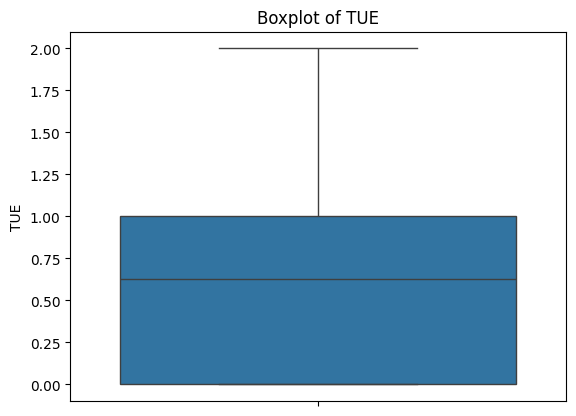

In [24]:
#visualization of outliers after capping
for col in num_multi:
    sns.boxplot(df[col])
    plt.title(f'Boxplot of {col}')
    plt.show()

The approach worked and the boxplot showed no outliers detected.

## Task 4: Normalization/Standardization

In [25]:
from sklearn.preprocessing import MinMaxScaler

In [26]:
scaler = MinMaxScaler()

In [27]:
df[num_multi] = scaler.fit_transform(df[num_multi])

# WEEK 2: Exploratory Data Analysis (EDA)

## Task 1 : summary statistics: 

In [28]:
df.describe()

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,SMOKE,CH2O,...,CAEC_Sometimes,CAEC_no,CALC_Frequently,CALC_Sometimes,CALC_no,MTRANS_Bike,MTRANS_Motorbike,MTRANS_Public_Transportation,MTRANS_Walking,height
count,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,...,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000
mean,0.505921,0.508326,0.478325,0.501147,0.817622,0.883941,0.709522,0.503380,0.020843,0.504006,...,0.836097,0.024159,0.033160,0.663667,0.302700,0.003316,0.005211,0.748460,0.026528,0.993276
std,0.500083,0.221414,0.177321,0.212292,0.386247,0.320371,0.266963,0.293712,0.142893,0.306477,...,0.370276,0.153580,0.179096,0.472566,0.459535,0.057502,0.072015,0.434001,0.160737,0.034584
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.896088
25%,0.000000,0.344804,0.342101,0.345483,1.000000,1.000000,0.500000,0.375000,0.000000,0.292406,...,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.966984
50%,1.000000,0.475673,0.476089,0.504659,1.000000,1.000000,0.692751,0.625000,0.000000,0.500000,...,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.993437
75%,1.000000,0.606882,0.605261,0.678308,1.000000,1.000000,1.000000,0.625000,0.000000,0.738710,...,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.018293
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.091923


## Task 2 : Distribution Analysis

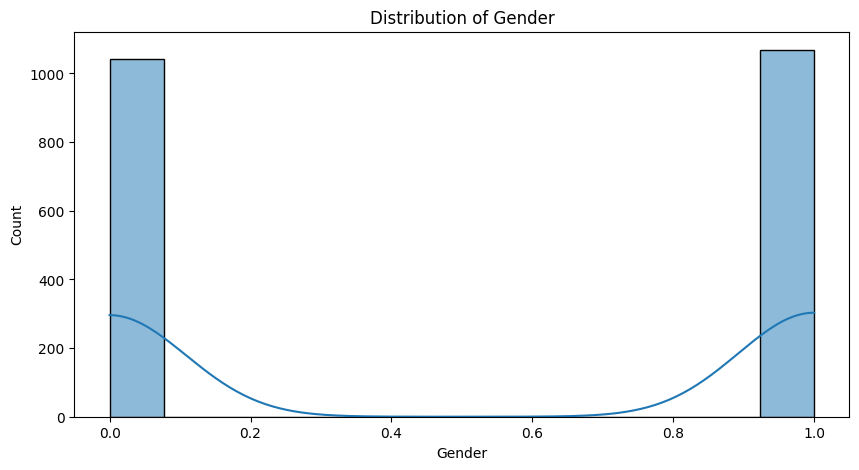

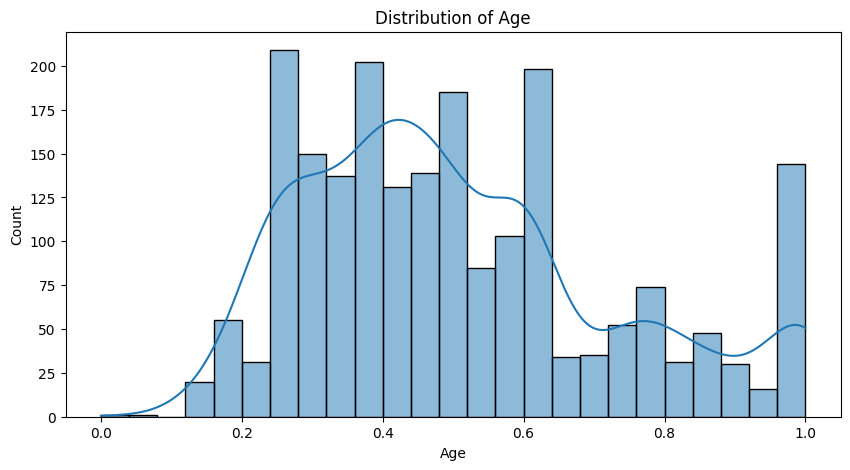

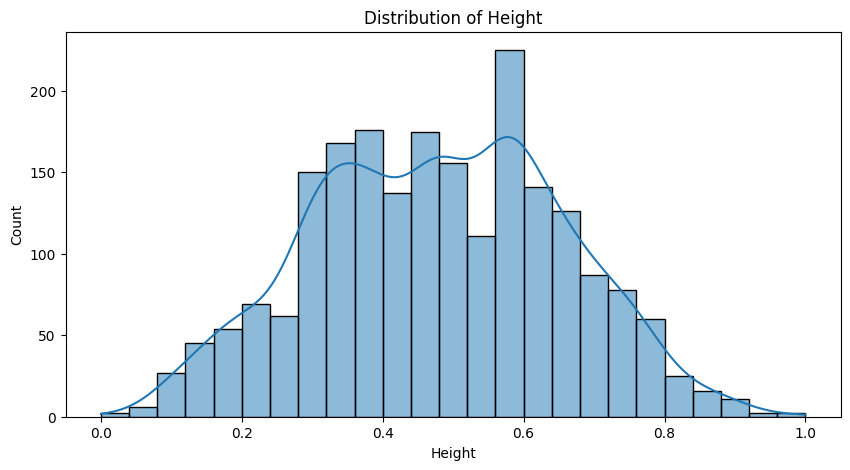

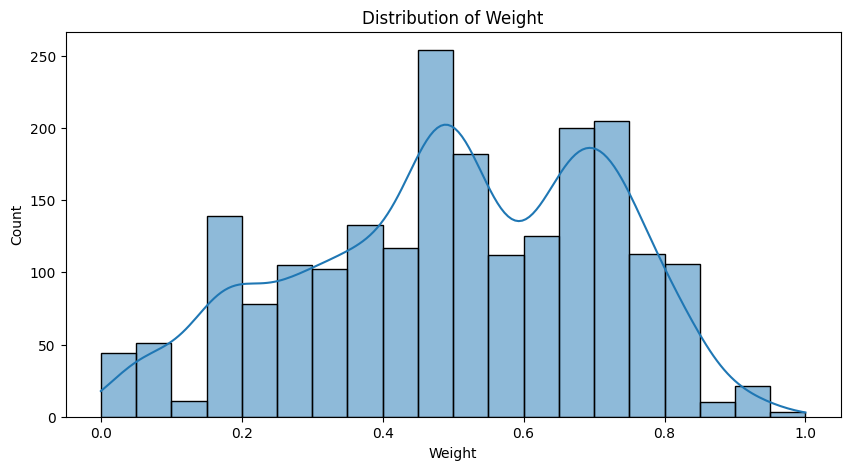

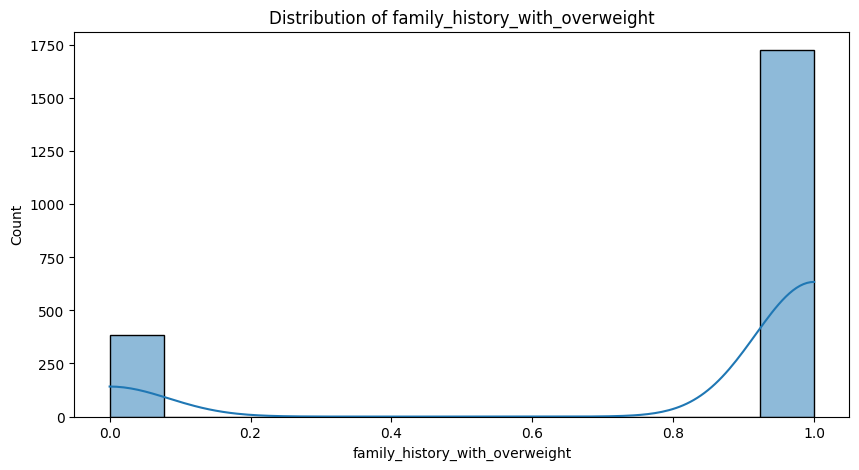

...

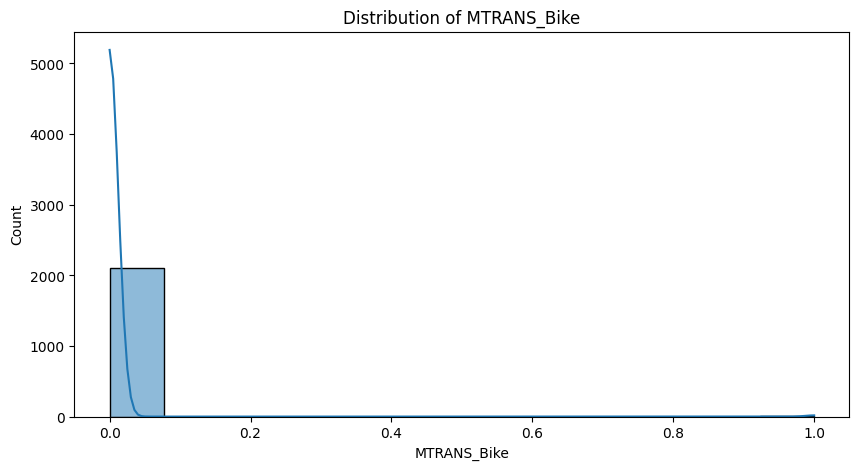

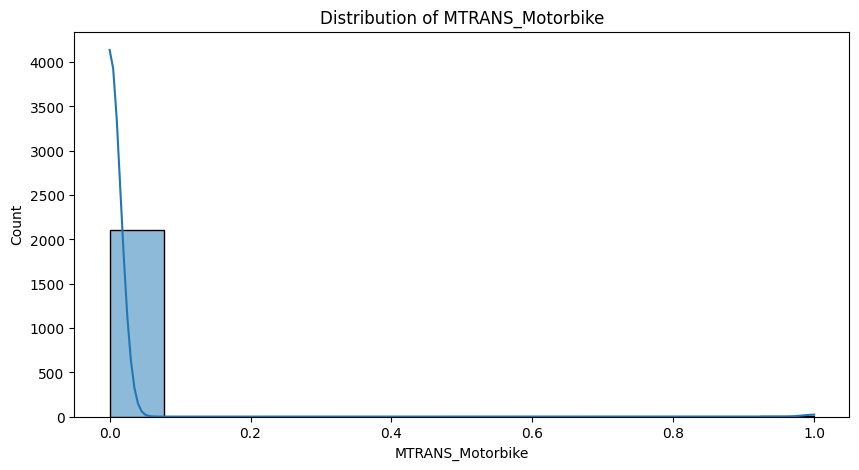

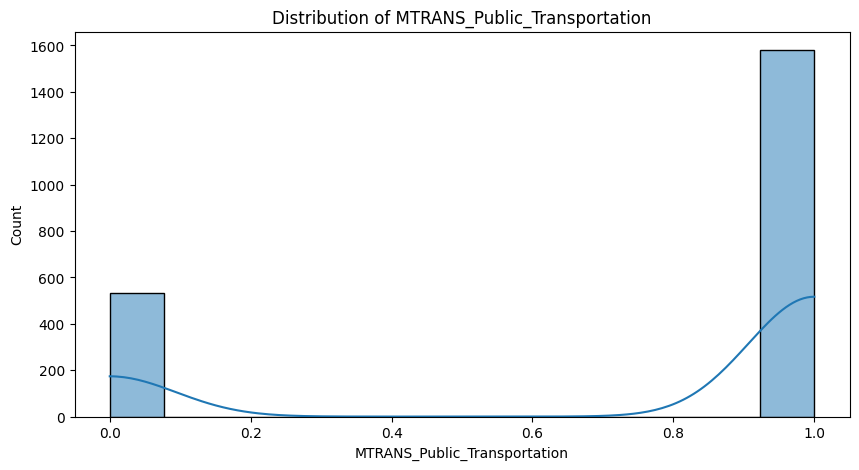

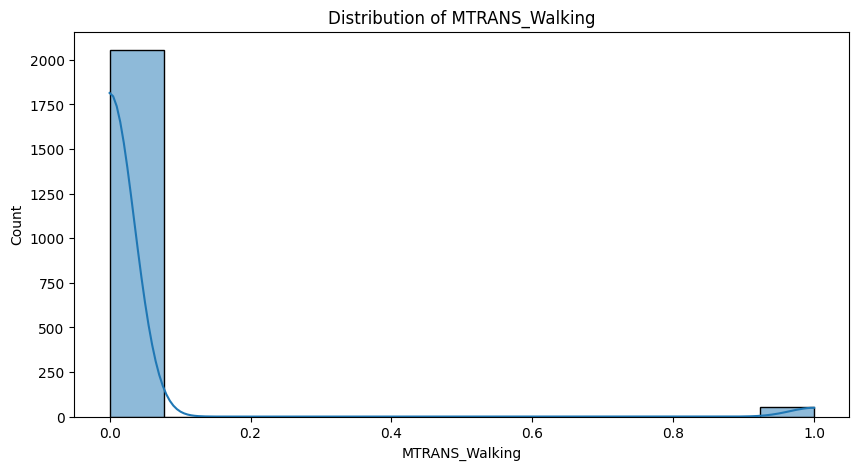

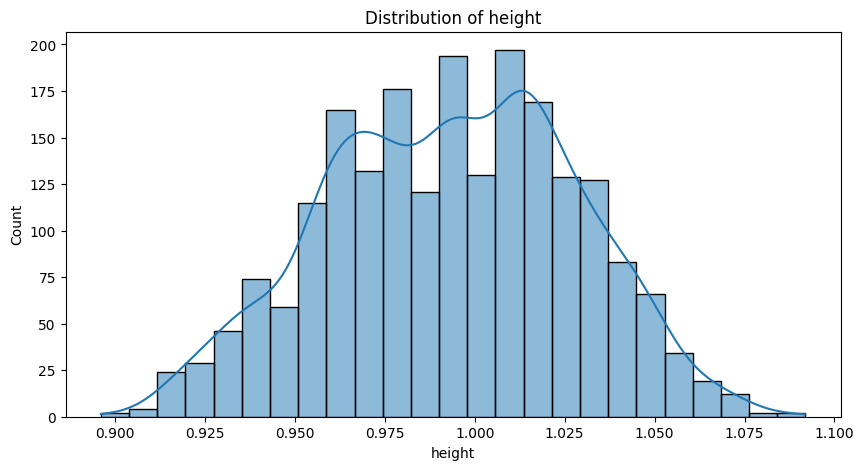

In [29]:
for col in df.columns:
    plt.figure(figsize=(10, 5))
    sns.histplot(df[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.show()

## Task 3 : Relationship Exploration using boxplots

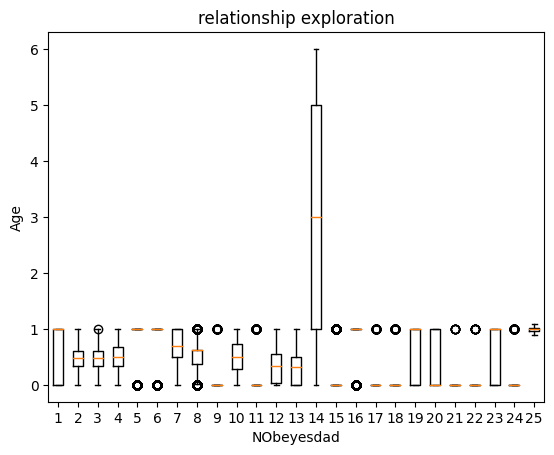

In [30]:
plt.boxplot(df)
# Adds title
plt.title('relationship exploration')
plt.xlabel('NObeyesdad')
plt.ylabel('Age')
plt.show()

In [31]:
df.columns

Index(['Gender', 'Age', 'Height', 'Weight', 'family_history_with_overweight',
       'FAVC', 'FCVC', 'NCP', 'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE',
       'NObeyesdad', 'CAEC_Frequently', 'CAEC_Sometimes', 'CAEC_no',
       'CALC_Frequently', 'CALC_Sometimes', 'CALC_no', 'MTRANS_Bike',
       'MTRANS_Motorbike', 'MTRANS_Public_Transportation', 'MTRANS_Walking',
       'height'],
      dtype='object')

explanations

## Task 4 : Correlation Analysis

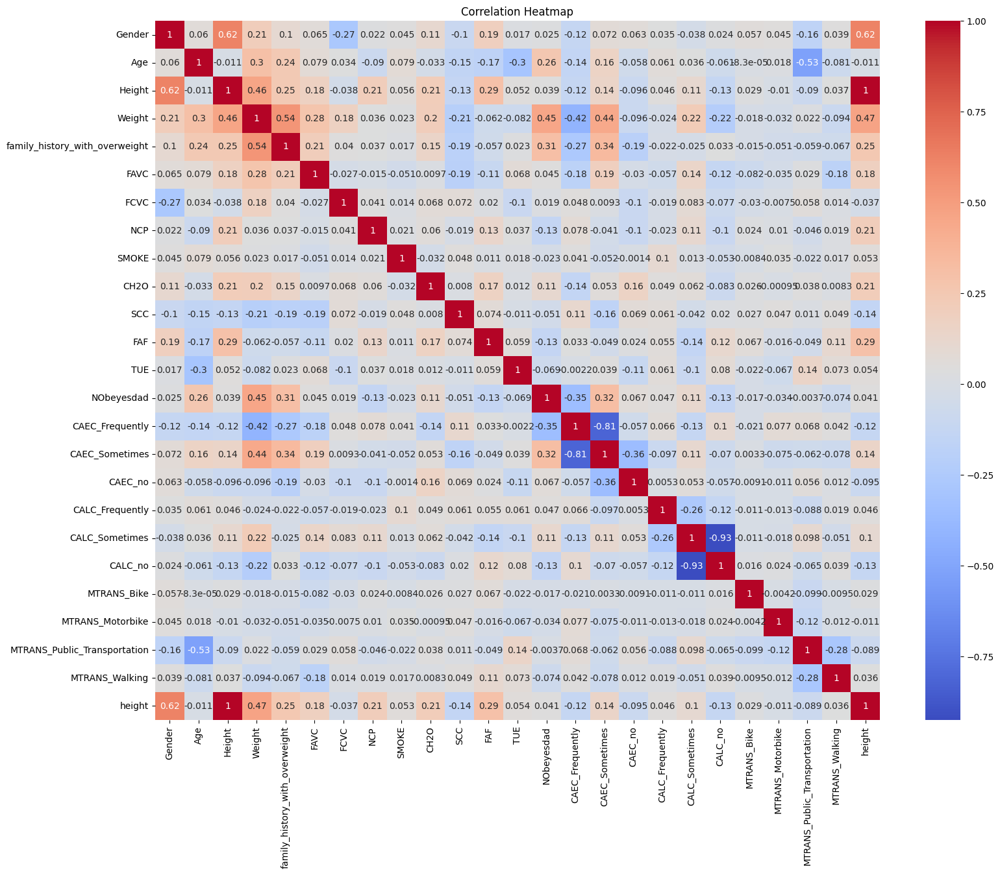

In [32]:
plt.figure(figsize=(18, 14))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

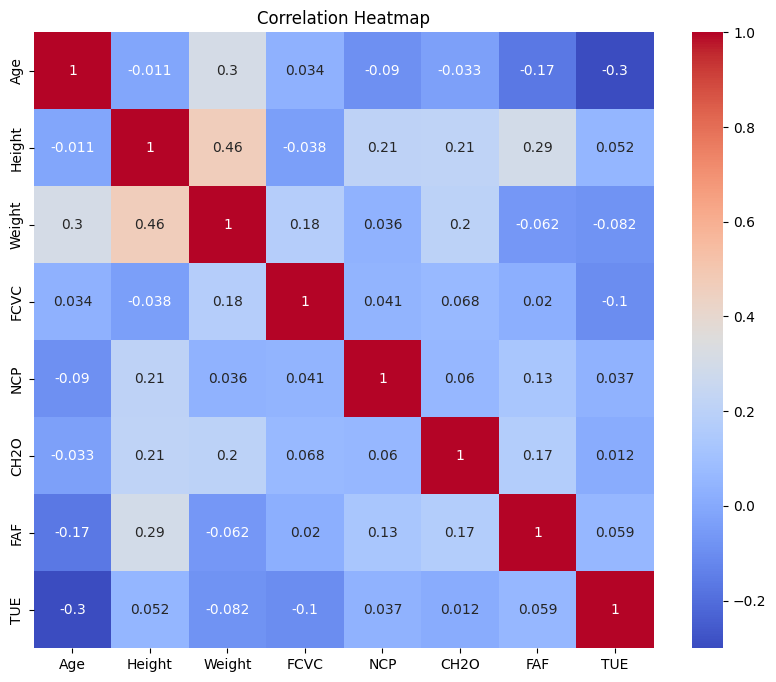

In [33]:
plt.figure(figsize=(10, 8))
sns.heatmap(df[num_multi].corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

# WEEK 3 : Advanced Visualizations and Machine Learning

In [34]:
df.columns

Index(['Gender', 'Age', 'Height', 'Weight', 'family_history_with_overweight',
       'FAVC', 'FCVC', 'NCP', 'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE',
       'NObeyesdad', 'CAEC_Frequently', 'CAEC_Sometimes', 'CAEC_no',
       'CALC_Frequently', 'CALC_Sometimes', 'CALC_no', 'MTRANS_Bike',
       'MTRANS_Motorbike', 'MTRANS_Public_Transportation', 'MTRANS_Walking',
       'height'],
      dtype='object')

## Task 1: Advanced Visualizations

In [35]:
from ydata_profiling import ProfileReport

In [36]:
profile = ProfileReport(df, title="Pandas Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [37]:
profile.to_file("Obesity_rates_in_CUBA.html") 

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### Insights 

1. **Age, Height, and Weight**:
   - **Weight** likely shows a right-skewed distribution, with some individuals on the higher end. Higher weight could naturally correlate with higher obesity levels, so we might see weight values gradually increasing across categories from "Normal Weight" to "Obesity Type III."
   - **Age** could have a peak in the younger to middle-aged groups, given obesity trends are often high in certain adult age ranges. If the dataset reflects real-world trends, we might expect higher obesity levels within specific age brackets.
   
2. **Family History of Overweight**:
   - For individuals with a family history of overweight, the data might show higher counts in the "Overweight" or "Obesity" categories compared to those without. This could suggest a genetic or familial influence on obesity risk, which is a valuable insight for prediction.

3. **High-Calorie Food Consumption (FAVC) and Vegetable Consumption (FCVC)**:
   - Higher values for **FAVC** and lower values for **FCVC** might be more common in individuals in higher obesity categories. If there's a strong trend here, it would suggest that regular high-calorie food consumption combined with low vegetable intake is a significant predictor of obesity.

4. **Physical Activity (FAF) and Technological Device Usage (TUE)**:
   - **FAF** (frequency of physical activity) and **TUE** (time using electronic devices) could show an inverse relationship with obesity. For instance, low physical activity and high device usage might be more common in individuals with higher obesity levels. If visualizations reveal this, it could highlight the role of sedentary lifestyle factors in obesity.

5. **Obesity Levels (NObeyesdad)**:
   - Visualization of obesity levels might show a distribution leaning more toward the "Overweight" and "Obesity Type I" categories, depending on the dataset's real-world representativeness. An unbalanced distribution with fewer "Insufficient Weight" or "Normal Weight" records might indicate a higher overall obesity rate in the population sampled.

6. **Mode of Transportation (MTRANS)**:
   - Transportation mode can reveal insights about daily activity levels. If active modes (walking, biking) are associated more with lower obesity levels, while inactive modes (car, public transport) correlate with higher obesity levels, this might suggest that transportation choices influence physical activity and, consequently, weight.

These interpretations can help shape the modeling process by prioritizing features like physical activity, family history, diet, and lifestyle choices, which appear to correlate with obesity levels.

-------------------------------------------------------------------------------------------------
Here are some deeper insights into possible relationships between the columns based on the dataset's characteristics:

1. **Gender and Obesity Level**:
   - **Gender** might reveal differences in obesity levels, with one gender potentially having higher counts in certain obesity categories. Studies sometimes show varying obesity rates by gender due to physiological, cultural, or lifestyle factors, so it would be insightful to see if this dataset reflects similar patterns.

2. **Number of Main Meals (NCP) and Obesity Level**:
   - There might be an optimal range for the number of meals, with lower or higher values correlating with increased obesity. For example, fewer meals could lead to overeating or increased calorie intake per meal, while more frequent meals might be associated with either balanced or excessive calorie intake. 

3. **Water Intake (CH2O) and Obesity Level**:
   - **CH2O** could show a trend where individuals with higher water consumption have lower obesity levels, as water intake is often linked with improved metabolism and satiety. If visualizations reveal this correlation, it would support the idea that hydration habits influence body weight.

4. **Alcohol Consumption (CALC) and Obesity Level**:
   - **CALC** categories (frequency of alcohol consumption) might show that more frequent alcohol consumption correlates with higher obesity levels. Alcohol can contribute to weight gain due to its caloric content, and a pattern here could indicate that regular drinking contributes to obesity.

5. **Mode of Transportation (MTRANS) and Physical Activity Frequency (FAF)**:
   - The **MTRANS** and **FAF** columns could jointly reveal lifestyle patterns. Active transportation modes, like walking or cycling, might correlate with higher physical activity levels, while inactive transportation modes (car, bus) could align with lower **FAF** values and potentially higher obesity levels.

6. **Calorie Monitoring (SCC) and Obesity Level**:
   - **SCC** (self-calorie control) might show that individuals who monitor their calorie intake are more likely to fall within "Normal Weight" or "Overweight" categories, suggesting that awareness and regulation of calorie intake can be effective in maintaining a healthier weight.

7. **Smoking Status (SMOKE) and Eating Habits**:
   - **SMOKE** might have an interesting relationship with high-calorie food consumption (**FAVC**) and physical activity (**FAF**). If smokers tend to consume more high-calorie foods or have lower physical activity, it could suggest a cluster of habits that may collectively impact obesity levels.

8. **Vegetable Consumption (FCVC) and Family History of Overweight**:
   - **FCVC** could show a trend where individuals with a family history of overweight consume fewer vegetables, potentially indicating learned dietary habits. This association could reinforce the idea that dietary choices influenced by family habits contribute to obesity risk.

9. **Physical Activity Frequency (FAF) and Technological Device Usage (TUE)**:
   - **FAF** and **TUE** might have an inverse relationship, as higher technology use often correlates with lower physical activity. If the dataset reveals this, it would highlight the role of sedentary behaviors in influencing obesity.

These insights emphasize the interconnected nature of diet, lifestyle, and personal habits, each playing a role in influencing obesity. Identifying these relationships can guide feature engineering and improve model performance by highlighting impactful attributes.

## Task 2: Feature Engineering and Scaling

### 1. Feature engineering

One big component to evaluate one's obesity state is through calculating their BMI: Body mass index; the body mass divided by the square of the body height.
Diet and Lifestyle Scores: These aggregate individual features to capture diet quality and lifestyle.


In [38]:
# Create BMI feature
df['BMI'] = df['Weight'] / (df['Height'] ** 2)

In [39]:
# Calculate Diet Score (FAVC, FCVC, CAEC related to diet choices)
df['Diet_Score'] = (
    df['FAVC'] * 1    # 1 if high-calorie food is frequently consumed
    - df['FCVC'] * 2  # Positive influence for high vegetable intake
    + (df['CAEC_Frequently'] * 1.5 + df['CAEC_Sometimes'] * 0.5)
)

In [40]:
# Calculate Lifestyle Score (FAF, TUE, and MTRANS related to activity/sedentary level)
df['Lifestyle_Score'] = (
    df['FAF'] * 2   # Higher weight for frequency of physical activity
    - df['TUE'] * 1 # Negative influence for higher tech device usage
    - (df['MTRANS_Public_Transportation'] + df['MTRANS_Motorbike']) * 1
    + (df['MTRANS_Walking'] + df['MTRANS_Bike']) * 1.5
)

In [41]:
df.columns

Index(['Gender', 'Age', 'Height', 'Weight', 'family_history_with_overweight',
       'FAVC', 'FCVC', 'NCP', 'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE',
       'NObeyesdad', 'CAEC_Frequently', 'CAEC_Sometimes', 'CAEC_no',
       'CALC_Frequently', 'CALC_Sometimes', 'CALC_no', 'MTRANS_Bike',
       'MTRANS_Motorbike', 'MTRANS_Public_Transportation', 'MTRANS_Walking',
       'height', 'BMI', 'Diet_Score', 'Lifestyle_Score'],
      dtype='object')

In [42]:
# pca sur les elements encodées: 


In [43]:
# Drop redundant columns 
# df.drop(['Height', 'Weight', 'TUE', 'Age'], axis=1, inplace=True)

In [44]:
# Display the transformed DataFrame
df.head()

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,SMOKE,CH2O,...,CALC_Sometimes,CALC_no,MTRANS_Bike,MTRANS_Motorbike,MTRANS_Public_Transportation,MTRANS_Walking,height,BMI,Diet_Score,Lifestyle_Score
0,0,0.395435,0.323096,0.330238,1,0,0.5,0.625,0,0.5,...,0,1,0,0,1,0,0.963174,3.163478,-0.5,-1.500000
1,0,0.395435,0.133039,0.240904,1,0,1.0,0.625,1,1.0,...,1,0,0,0,1,0,0.924259,13.610820,-1.5,1.000000
2,1,0.485273,0.665197,0.454251,1,0,0.5,0.625,0,0.5,...,0,0,0,0,1,0,1.029619,1.026587,-0.5,-0.166667
3,1,0.644431,0.665197,0.536301,0,0,1.0,0.625,0,0.5,...,0,0,0,0,0,1,1.029619,1.212016,-1.5,2.833333
4,1,0.441330,0.627186,0.557607,0,0,0.5,0.000,0,0.5,...,1,0,0,0,1,0,1.022451,1.417541,-0.5,-1.000000


### 2. last check on data shape and encoding: 

In [45]:
df_new = df[np.isfinite(df).all(1)]

## Task 3: Train-Test Split

In [46]:
## Task 3: Train-Test Split
X = df_new.drop(columns=['NObeyesdad'])  
y = df_new['NObeyesdad'] 

In [47]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

## Task 4: Model Implementation

### 1. Logistic Regression

In [48]:
log_reg = LogisticRegression()
log_reg.fit(X_train, y_train)

LogisticRegression()

In [49]:
y_pred_lr= log_reg.predict(X_test)

### 2. Random Forest Classifier

In [50]:
# Random Forest Classifier
rf = RandomForestClassifier(n_estimators=100, random_state=42)

In [51]:
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)

### 3. XGBoost

In [52]:
xgb = XGBClassifier()
xgb.fit(X_train, y_train)
y_pred_xgb = xgb.predict(X_test)

### 4. SVM

In [53]:
svm = SVC(kernel='rbf')  # Try 'linear', 'poly', or 'sigmoid' kernels
svm.fit(X_train, y_train)
y_pred_svm = svm.predict(X_test)

### 5. KNN

In [54]:
knn = KNeighborsClassifier(n_neighbors=5)  # Choose k based on cross-validation
knn.fit(X_train, y_train)
y_pred_knn = knn.predict(X_test)

# Week 4 : Model Evaluation

## Task 1 : Model Evaluation

In [55]:
# model evaluation function
def evaluate_model(y_test, y_pred, model_name):
    print(f"Evaluation Metrics for {model_name}:")
    print(f"Accuracy: {accuracy_score(y_test, y_pred):.2f}")
    print(f"Precision: {precision_score(y_test, y_pred, average='weighted'):.2f}")
    print(f"Recall: {recall_score(y_test, y_pred, average='weighted'):.2f}")
    print(f"F1 Score: {f1_score(y_test, y_pred, average='weighted'):.2f}")
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix for {model_name}')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

Evaluation Metrics for Logistic Regression:
Accuracy: 0.69
Precision: 0.67
Recall: 0.69
F1 Score: 0.67


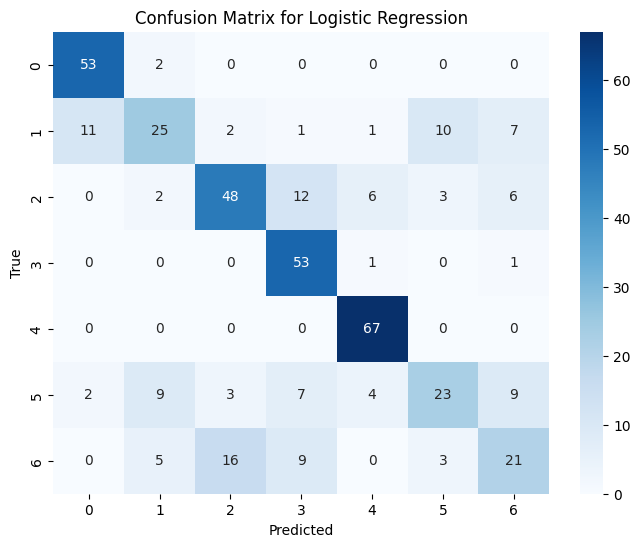

Evaluation Metrics for Random Forest Classifier:
Accuracy: 0.95
Precision: 0.95
Recall: 0.95
F1 Score: 0.95


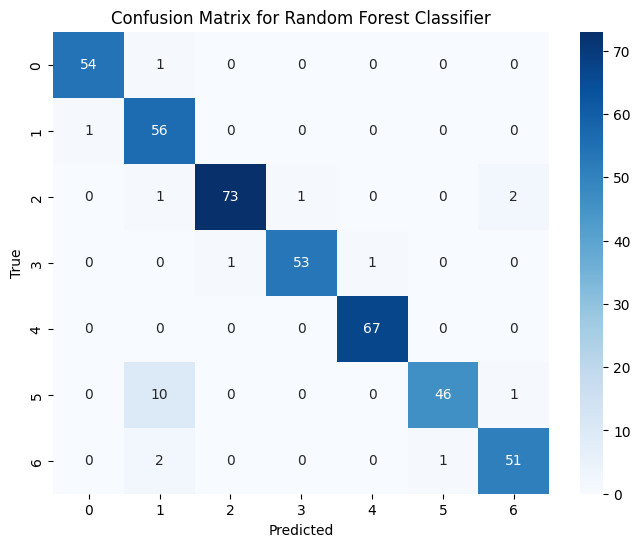

Evaluation Metrics for XGBOOST:
Accuracy: 0.95
Precision: 0.95
Recall: 0.95
F1 Score: 0.95


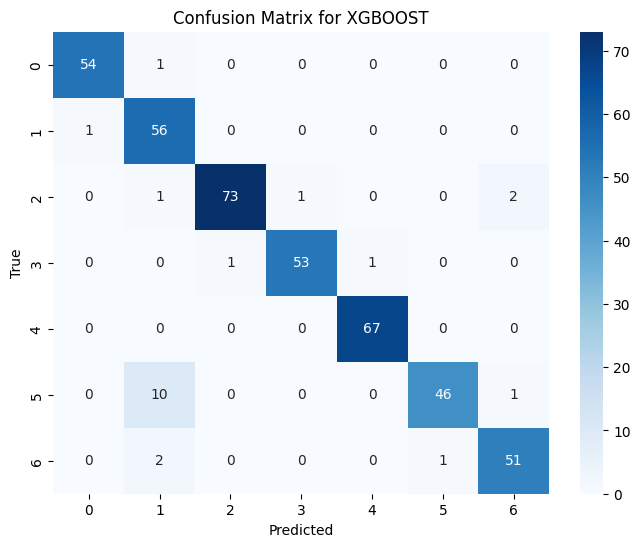

Evaluation Metrics for SVM:
Accuracy: 0.95
Precision: 0.95
Recall: 0.95
F1 Score: 0.95


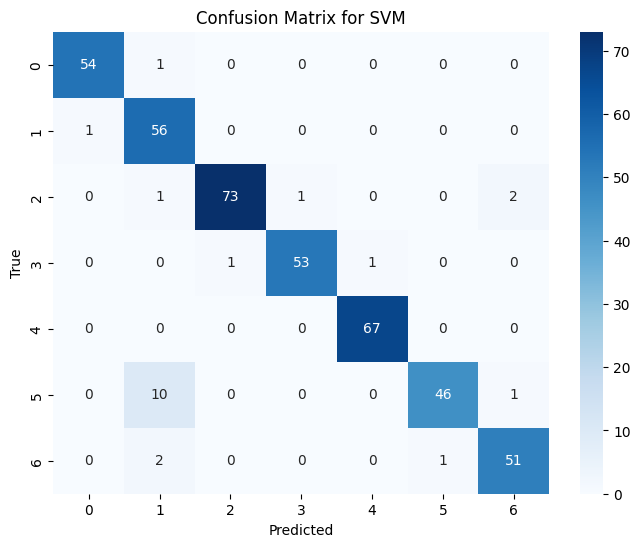

Evaluation Metrics for KNN:
Accuracy: 0.95
Precision: 0.95
Recall: 0.95
F1 Score: 0.95


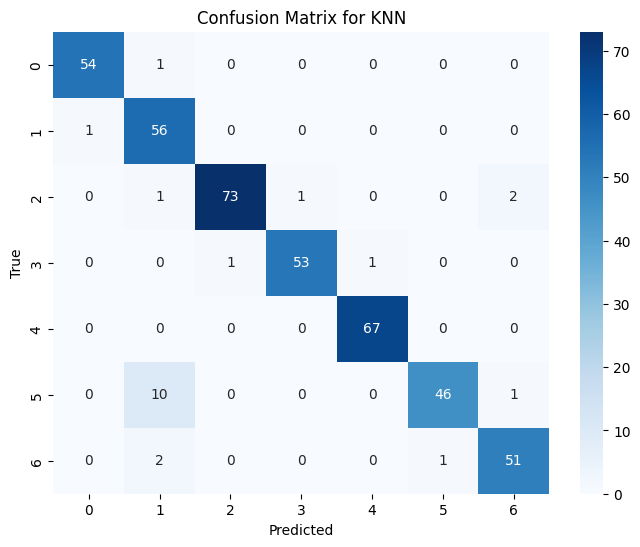

In [56]:
# Evaluation metrics
evaluate_model(y_test, y_pred_lr, "Logistic Regression")
evaluate_model(y_test, y_pred_rf, "Random Forest Classifier")
evaluate_model(y_test, y_pred_rf, "XGBOOST")
evaluate_model(y_test, y_pred_rf, "SVM")
evaluate_model(y_test, y_pred_rf, "KNN")

## Task 2 : documentation

The results along with the process are documented in the comprehensive report sent along with the code. 